In [1]:
import slangpy as spy
from itertools import islice
from pyglm import glm
import torch
import torchvision
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt

from cs248a_renderer import setup_device, RendererModules
from cs248a_renderer.renderer.core_renderer import Renderer
from cs248a_renderer.model.volumes import DenseVolume
from cs248a_renderer.model.transforms import Transform3D

from cs231nfinal.camera import RandomCameraTransform
from cs231nfinal.tvnorm import tv_image_loss_isotropic, tv_volume_loss_isotropic
from cs231nfinal.style import NaiveStylizer, InjectionStylizer, InjectionStylizer2, GatysStylizer

%load_ext autoreload
%autoreload 2

device = setup_device([])
renderer_modules = RendererModules(device)

[WARN] No supported shader model found, pretending to support sm_6_0.


In [2]:
# OUTPUT_IMG_SIZE = (800, 800)
PROCESS_IMG_SIZE = (256, 256)
PREVIEW_IMG_SIZE = (512, 512)

# create framebuffers
output_image = device.create_texture(
    type=spy.TextureType.texture_2d,
    format=spy.Format.r32_float,
    usage=spy.TextureUsage.unordered_access,
    width=PROCESS_IMG_SIZE[0],
    height=PROCESS_IMG_SIZE[1],
)

output_preview = device.create_texture(
    type=spy.TextureType.texture_2d,
    format=spy.Format.r32_float,
    usage=spy.TextureUsage.unordered_access,
    width=PREVIEW_IMG_SIZE[0],
    height=PREVIEW_IMG_SIZE[1],
)

output_mask = device.create_texture(
    type=spy.TextureType.texture_2d,
    format=spy.Format.r32_float,
    usage=spy.TextureUsage.unordered_access,
    width=PROCESS_IMG_SIZE[0],
    height=PROCESS_IMG_SIZE[1],
)
# Setup the renderer
renderer = Renderer(
    device=device,
    render_texture=output_image,
    render_modules=renderer_modules
)
renderer.sqrt_spp = 1
renderer._ambientColor = glm.vec4(1.0, 1.0, 1.0, 1.0)

preview_renderer = Renderer(
    device=device,
    render_texture=output_preview,
    render_modules=renderer_modules
)
preview_renderer.sqrt_spp = 1
preview_renderer._ambientColor = glm.vec4(1.0, 1.0, 1.0, 1.0)

mask_renderer = Renderer(
    device=device,
    render_texture=output_mask,
    render_modules=renderer_modules
)
mask_renderer.sqrt_spp = 1
mask_renderer._ambientColor = glm.vec4(1.0, 1.0, 1.0, 1.0)

In [3]:
from cs231nfinal.data import DatasetID, DataSet
import numpy as np
from openvdb import FloatGrid

dataset = DataSet.Get(DatasetID.SMOKE_MIDRES)

data_array = np.zeros(dataset.resolution)
grid = dataset.get_grid("density", frame=70, type=FloatGrid)

grid.copyToArray(data_array, ijk=grid.evalLeafBoundingBox()[0])
min, max = grid.evalMinMax()

# normalize data
data_array = 0.5 * ((data_array + min) / (max - min))

CAMERA_DIST = 23
VOLUME_POS = glm.vec3(0,2.8,3.5)

In [4]:
def make_dense_volume(volume_tensor) -> DenseVolume:
    return DenseVolume(
        name="volume",
        transform=Transform3D(position=VOLUME_POS),
        data=volume_tensor.detach().numpy().astype(np.float32),
        properties={
            "pivot": (0.5, 0.5, 0.5),
            "voxel_size": dataset.voxel_size,
        },
    )

def show_preview(dense_volume, cam_mat, fov):
    preview_renderer.load_volume(volume=dense_volume)
    preview_renderer.render(cam_mat, fov)
    preview_res = np.flipud(output_preview.to_numpy().copy())
    plt.imshow(preview_res, cmap="gray")
    plt.axis("off")
    plt.show()

In [18]:
params = {
    "num_epochs": 20,
    "num_cameras": 8,
    "learning_rate": 1e-2,
    # "tv_weight_2d": 0,
    "tv_weight_3d": 0.0000,
    "cam_kappa": 10,
    "cam_fov": 40,
}


# stylizer = NaiveStylizer(PROCESS_IMG_SIZE, "data/style/good_ones/dark_matter_bw.png")
# stylizer = InjectionStylizer(PROCESS_IMG_SIZE, "data/style/good_ones/dark_matter_bw.png")
# stylizer = InjectionStylizer2(PROCESS_IMG_SIZE, "data/style/good_ones/dark_matter_bw.png", invert=True)
stylizer = GatysStylizer(PROCESS_IMG_SIZE, "data/style/good_ones/dark_matter_bw.png", device="mps")

Epochs:   0%|          | 0/20 [00:00<?, ?it/s]

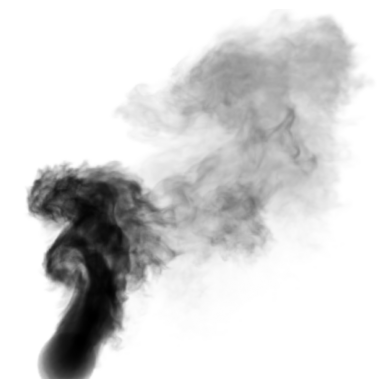

tensor(7.6753e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(0., grad_fn=<MulBackward0>)


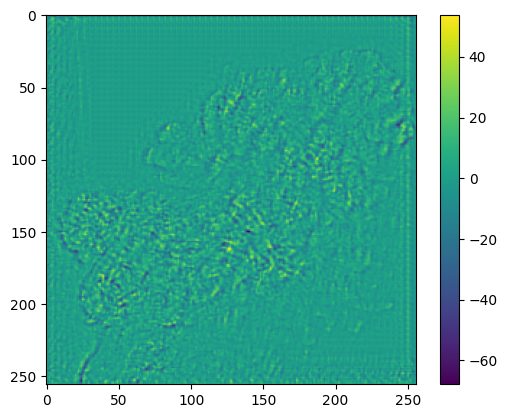

1.822366e+07


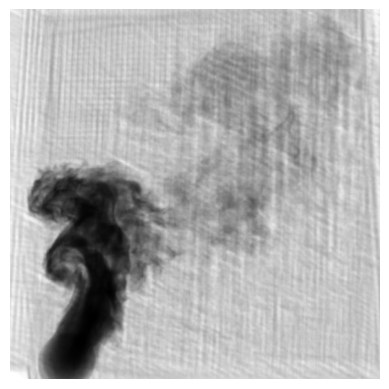

tensor(7.6752e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(0.1706, grad_fn=<MulBackward0>)


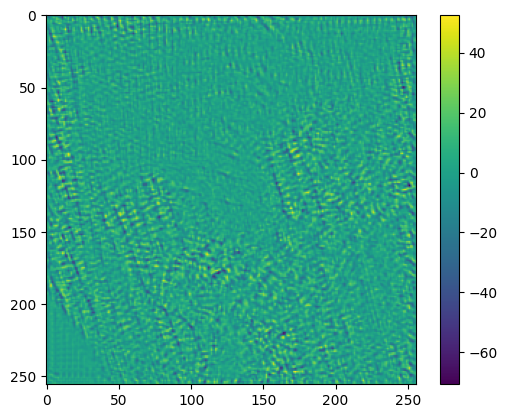

1.7967534e+07


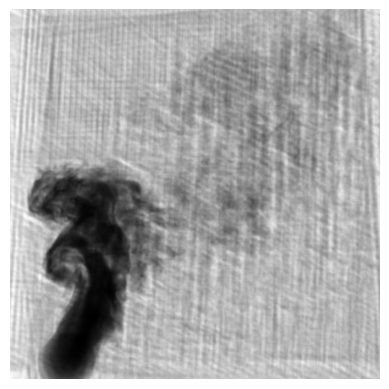

tensor(7.6752e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(0.4145, grad_fn=<MulBackward0>)


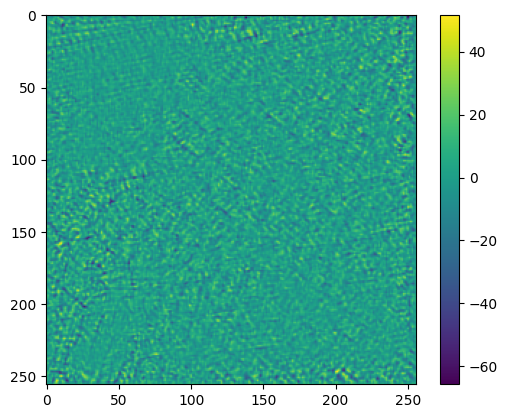

2.2153828e+07


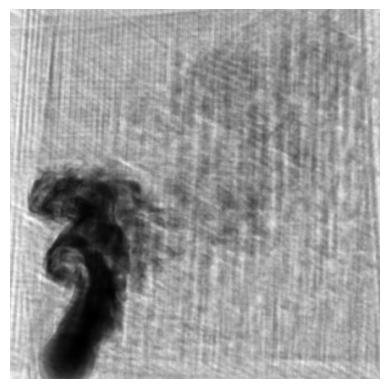

tensor(7.6752e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(0.7069, grad_fn=<MulBackward0>)


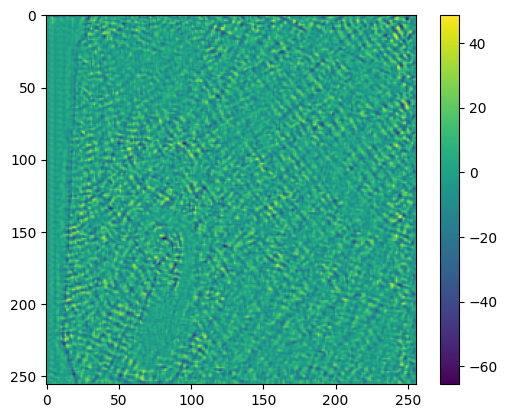

2.0842948e+07


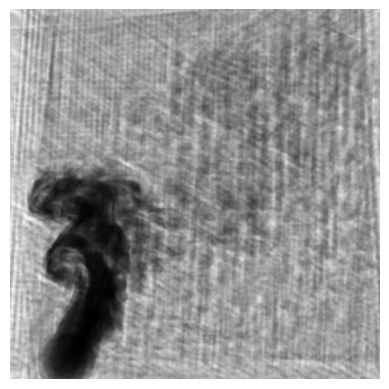

tensor(7.6751e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(1.0156, grad_fn=<MulBackward0>)


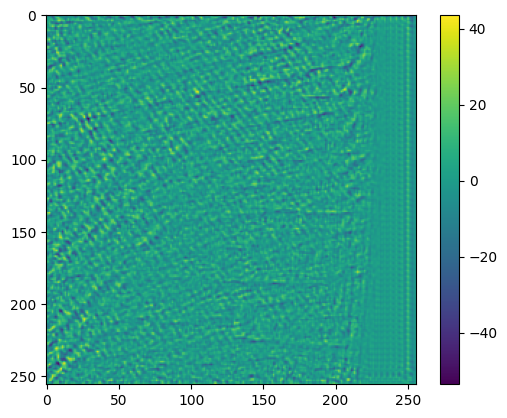

2.2206232e+07


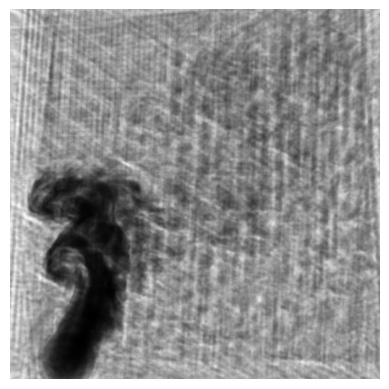

tensor(7.6749e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(1.3451, grad_fn=<MulBackward0>)


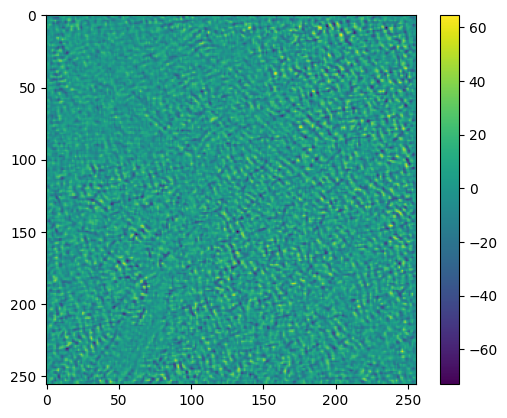

2.7372788e+07


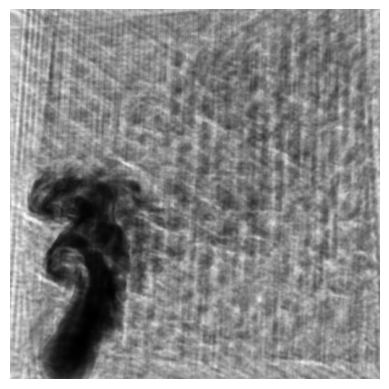

tensor(7.6752e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(1.6885, grad_fn=<MulBackward0>)


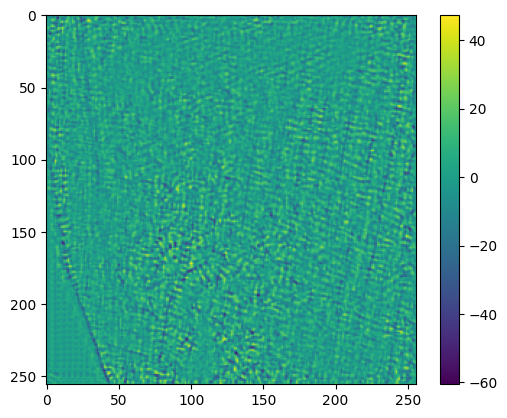

2.3453114e+07


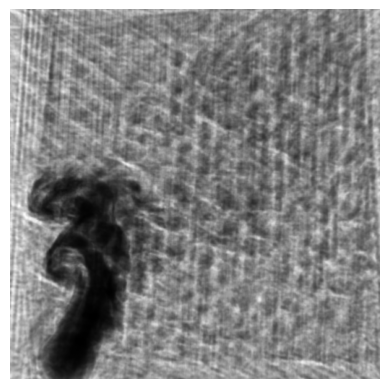

tensor(7.6750e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(2.0376, grad_fn=<MulBackward0>)


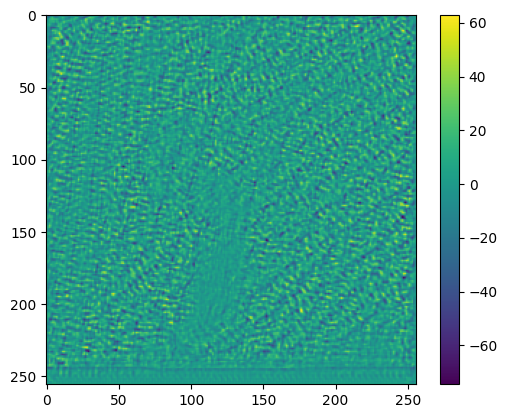

2.4582276e+07


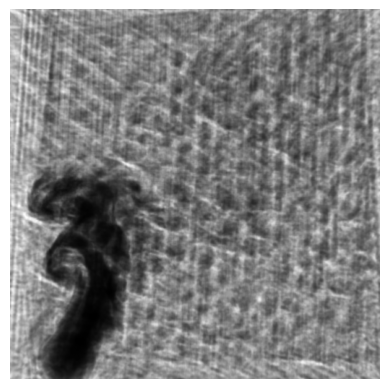

tensor(7.6748e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(2.3830, grad_fn=<MulBackward0>)


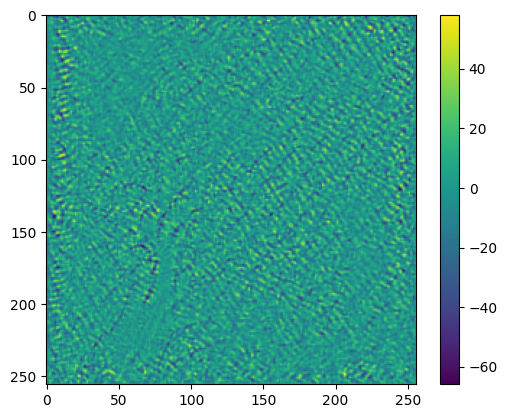

2.6387892e+07


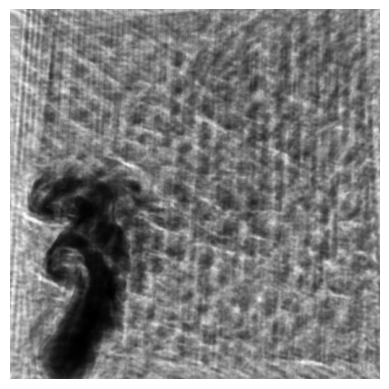

tensor(7.6749e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(2.7347, grad_fn=<MulBackward0>)


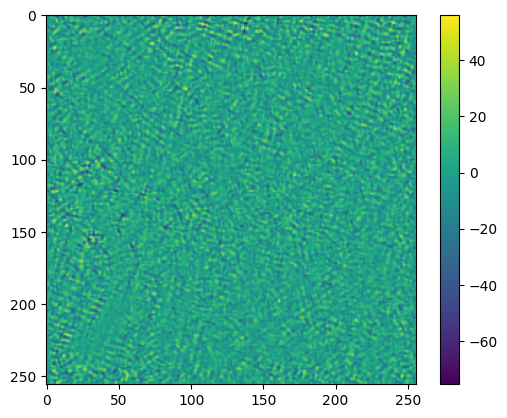

2.6999342e+07


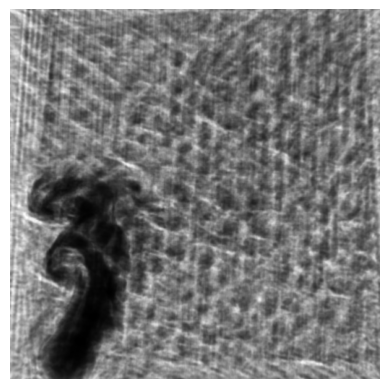

tensor(7.6749e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(3.0944, grad_fn=<MulBackward0>)


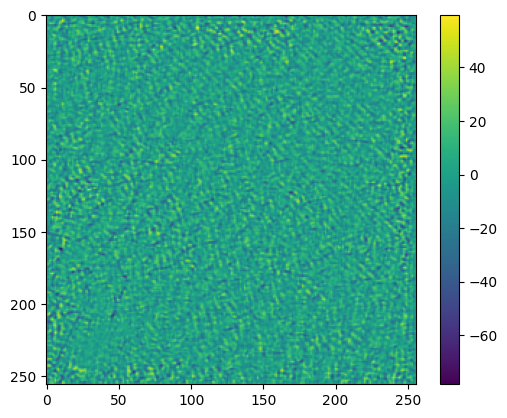

2.5313372e+07


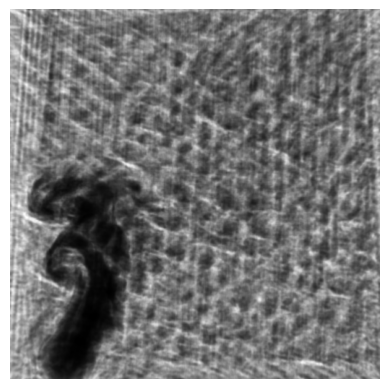

tensor(7.6747e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(3.4563, grad_fn=<MulBackward0>)


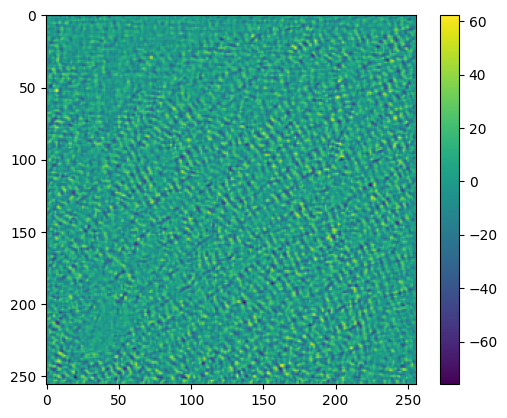

2.602252e+07


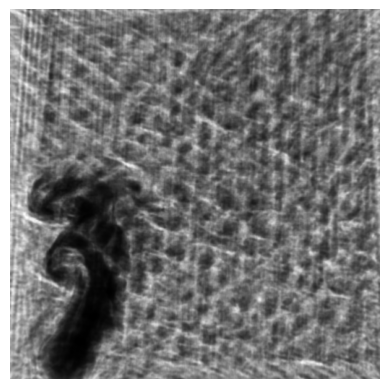

tensor(7.6745e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(3.8163, grad_fn=<MulBackward0>)


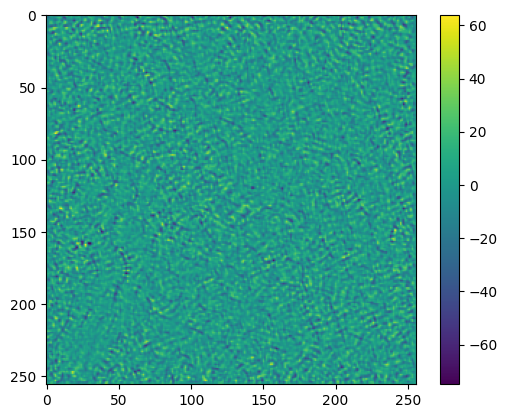

3.2958438e+07


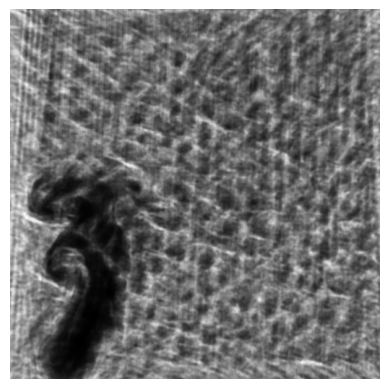

tensor(7.6748e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(4.1761, grad_fn=<MulBackward0>)


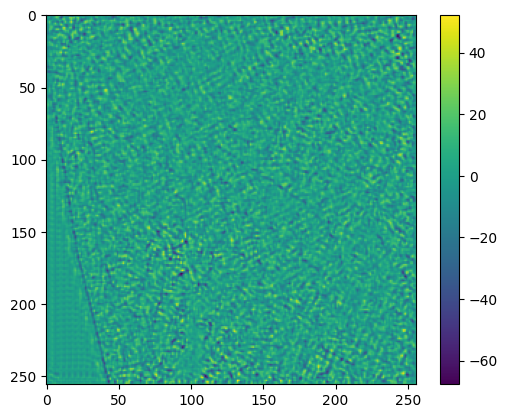

2.4223762e+07


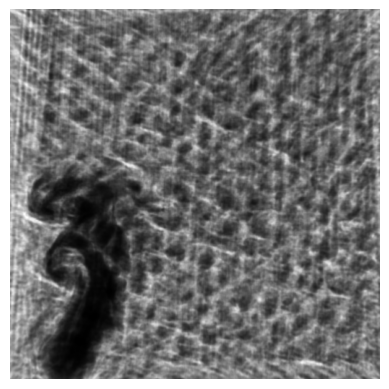

tensor(7.6745e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(4.5285, grad_fn=<MulBackward0>)


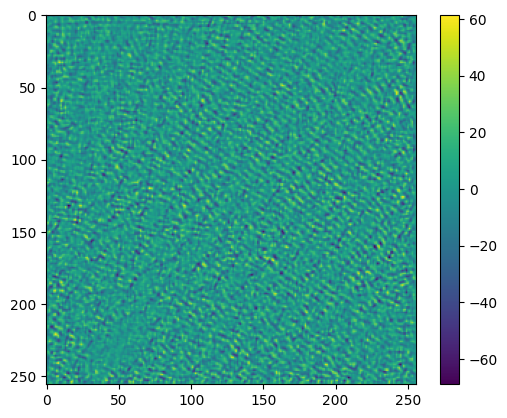

2.8847366e+07


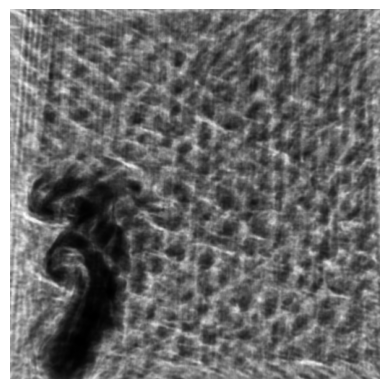

tensor(7.6746e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(4.8816, grad_fn=<MulBackward0>)


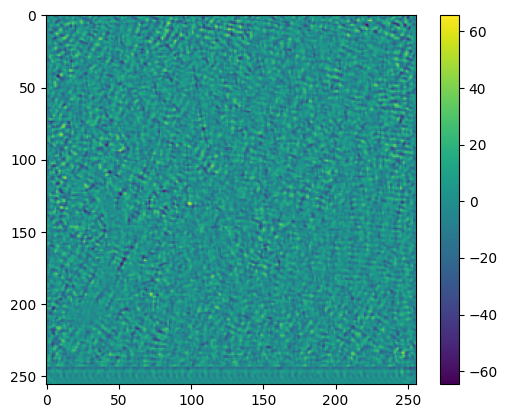

2.6105556e+07


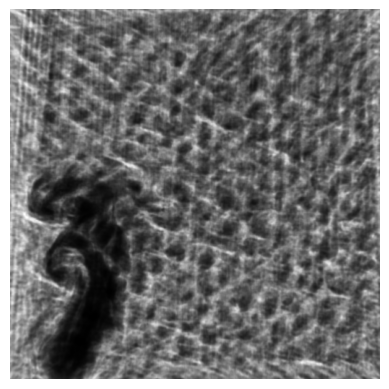

tensor(7.6747e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(5.2325, grad_fn=<MulBackward0>)


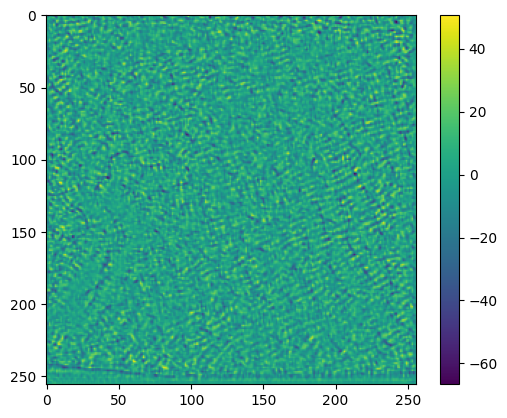

2.8380214e+07


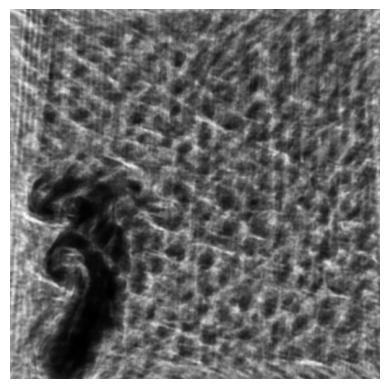

tensor(7.6747e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(5.5760, grad_fn=<MulBackward0>)


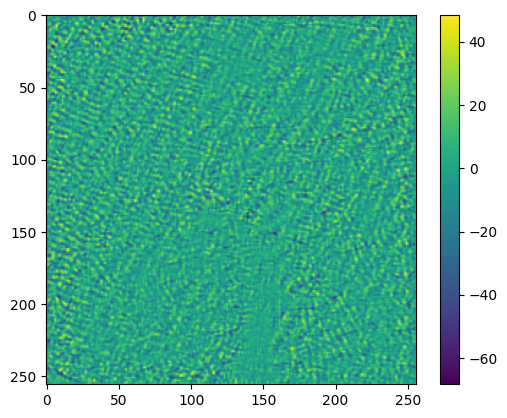

2.6652792e+07


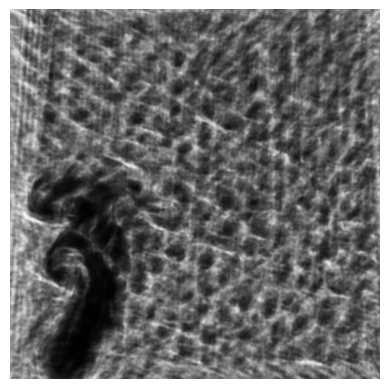

tensor(7.6741e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(5.9123, grad_fn=<MulBackward0>)


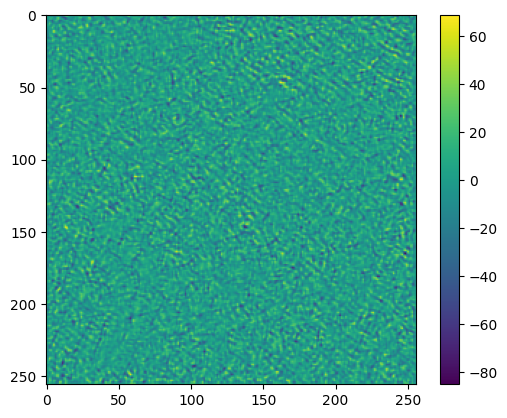

3.54012e+07


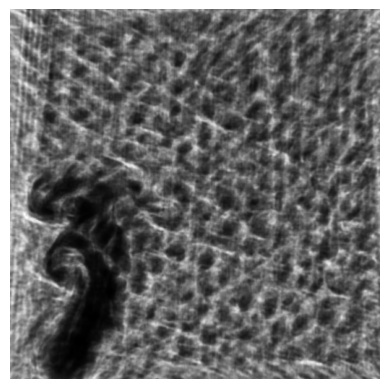

tensor(7.6741e+08, device='mps:0', grad_fn=<SumBackward0>) tensor(6.2465, grad_fn=<MulBackward0>)


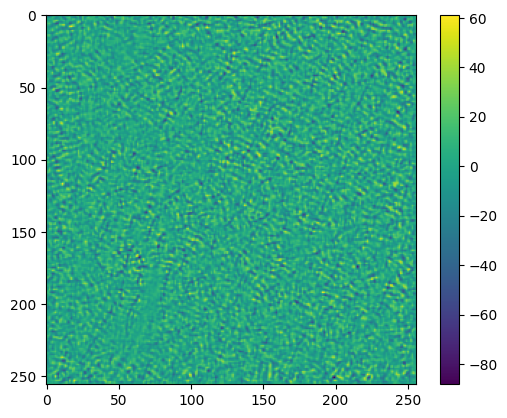

3.662811e+07


: 

In [ ]:
cam_transform = RandomCameraTransform(CAMERA_DIST, kappa=params["cam_kappa"])
canonical_cam = next(RandomCameraTransform(CAMERA_DIST, kappa=np.inf))

grid.copyToArray(data_array, ijk=grid.evalLeafBoundingBox()[0])
min, max = grid.evalMinMax()

# normalize data
data_array = 0.5 * ((data_array + min) / (max - min))
original_tensor = torch.tensor(data_array.astype(np.float32))
input_tensor = torch.tensor(data_array.astype(np.float32), requires_grad=True)
input_density_total = input_tensor.sum()

batch_losses = []

# density_gain = torch.ones_like(input_tensor, requires_grad=True)

optim = torch.optim.Adam([input_tensor], lr=params["learning_rate"])
scheduler = torch.optim.lr_scheduler.ExponentialLR(optim, 0.99)

dense_mask_volume = make_dense_volume(input_tensor)
mask_renderer.load_volume(dense_mask_volume)

for epoch in tqdm(range(params["num_epochs"]), desc="Epochs"):
    optim.zero_grad()

    scaled_input = input_tensor #* density_gain
    # preserve density
    #density_normalized_input = scaled_input * (input_density_total / scaled_input.sum())
    dense_volume = make_dense_volume(scaled_input) #density_normalized_input

    renderer.load_volume(volume=dense_volume)

    if (epoch % 1) == 0:
        show_preview(dense_volume, canonical_cam, params["cam_fov"])


    volume_renders = []
    mask_renders = []
    view_mats = list(islice(cam_transform, params["num_cameras"]))
    for i in range(params["num_cameras"]):
        renderer.render(view_mats[i], params["cam_fov"])
        volume_render = torch.tensor(np.flipud(output_image.to_numpy()).copy(), requires_grad=True)
        volume_renders.append(volume_render)

        mask_renderer.render(view_mats[i], params["cam_fov"])
        mask_render = torch.tensor(np.flipud(output_mask.to_numpy()).copy())
        mask_renders.append(mask_render)
    
    render_stack = torch.stack(volume_renders)
    render_stack.retain_grad()
    mask_stack = torch.stack(mask_renders)
    loss_fn = torch.nn.MSELoss()
    # tv_loss = params["tv_weight_3d"] * tv_volume_loss_isotropic(density_normalized_input)
    
    # render_stack_channels = render_stack[:,torch.newaxis,:,:].repeat((1,3,1,1)).detach()
    # style = stylizer.style(render_stack_channels.to("mps")).cpu().mean(1, keepdim=True)

    # style_mask = 1 - mask_stack
    # masked_style = style * style_mask + (1 - style_mask.to(torch.float32))
    # plt.imshow(style[0].permute((1,2,0)).to(torch.float32))
    # plt.show()
    # style_loss = loss_fn(render_stack, style)# + tv_loss
    style_loss = stylizer.loss(render_stack, mask_stack)
    content_loss = loss_fn(input_tensor, original_tensor)
    print(style_loss, 10000*content_loss)
    loss = style_loss #+ 10000*content_loss
    batch_loss = loss.item()

    loss.backward()

    plt.imshow(render_stack.grad[0])
    plt.colorbar()
    plt.show()

    gain_acc = np.zeros(input_tensor.shape).astype(np.float32)
    for i in range(params["num_cameras"]):
        renderer.render_volume_backward(
            view_mat=view_mats[i], 
            fov=params["cam_fov"], 
            out_grad=torch.flipud(render_stack.grad[i])
        )
        d_volume = renderer.get_d_volume().reshape(input_tensor.shape)
        gain_acc += d_volume
    
    print(gain_acc.sum())
    with torch.no_grad():
        ## grad == gain_acc / num_cameras
        #  input_tensor + grad == input_tensor * (density_gain + gain_update)
        #  1 + grad / input_tensor == density_gain + gain_update
        #  gain_update == 1 - density_gain + grad / input_tensor

        # gain_update = 1 - density_gain + torch.tensor(gain_acc) / (params["num_cameras"] * input_tensor)
        # if density_gain.grad:
        #     density_gain.grad = density_gain.grad + gain_update
        # else:
        #     density_gain.grad = gain_update

        # if density_gain.grad:
        #     density_gain.grad = density_gain.grad + torch.tensor(gain_acc) / params["num_cameras"]
        # else:
        #     density_gain.grad = torch.tensor(gain_acc) / params["num_cameras"]

        if input_tensor.grad is not None:
            input_tensor.grad = input_tensor.grad + torch.tensor(gain_acc) / params["num_cameras"]
        else:
            input_tensor.grad = torch.tensor(gain_acc) / params["num_cameras"]
        # assert(input_tensor.grad == None)
        
    
    optim.step()

    with torch.no_grad():
        input_tensor.clamp_(0, 100)
    #     density_gain.clamp_(0, 100)
    
    batch_losses.append(batch_loss)

    scheduler.step()



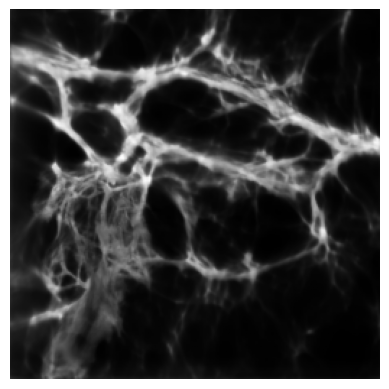

In [7]:
renderer.render(canonical_cam, params["cam_fov"])

volume_render = torch.tensor(np.flipud(output_image.to_numpy()).copy(), requires_grad=True)
plt.imshow(volume_render.detach().numpy(), cmap="gray")
plt.axis("off")
plt.show()

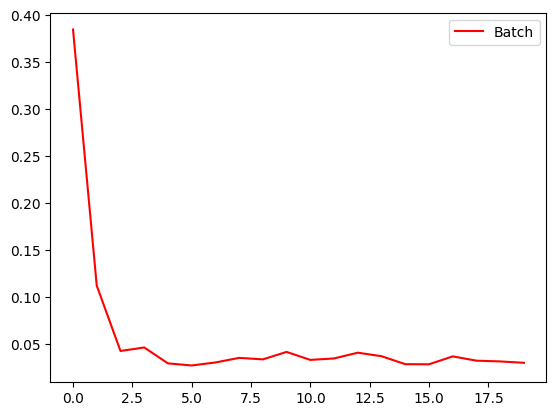

In [8]:
x = range(len(batch_losses))
plt.plot(x, batch_losses, label="Batch", color="red")
# plt.yscale("log")
plt.legend()
plt.show()

In [9]:
from openvdb import FloatGrid
from openvdb import write as write_vdb

test_out_grid = FloatGrid()
test_out_grid.name = "density"

test_out_np = (density_normalized_input).detach().numpy()
test_out_grid.copyFromArray(test_out_np)
write_vdb('test_out5.vdb', grids=[test_out_grid])

NameError: name 'density_normalized_input' is not defined